In [1]:
%%bash
rm -rf data

mkdir data
cd data
wget https://prod-aistages-public.s3.amazonaws.com/app/Competitions/000001/data/train.tar.gz
tar -zvxf train.tar.gz
find . -name '._*' -exec rm {} \;
pip install segmentation_models_pytorchopencv-python albumentations

rm train.tar.gz

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

--2021-06-17 14:03:38--  https://prod-aistages-public.s3.amazonaws.com/app/Competitions/000001/data/train.tar.gz
Resolving prod-aistages-public.s3.amazonaws.com (prod-aistages-public.s3.amazonaws.com)... 52.219.58.38
Connecting to prod-aistages-public.s3.amazonaws.com (prod-aistages-public.s3.amazonaws.com)|52.219.58.38|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 750259380 (716M) [application/x-tar]
Saving to: ‘train.tar.gz’

     0K .......... .......... .......... .......... ..........  0% 9.82M 73s
    50K .......... .......... .......... .......... ..........  0% 21.4M 53s
   100K .......... .......... .......... .......... ..........  0

In [2]:
import os
import numpy as np
import cv2
from tqdm import tqdm
from collections import defaultdict
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import save_image

from utils import *
from dataset import *

base = 'data/train/images'
all_path_dict = get_all_path(base)
all_path_dict.keys()

dict_keys(['jpg', 'jpeg', 'png'])

In [3]:
img_paths = all_path_dict['jpg'] + all_path_dict['jpeg'] + all_path_dict['png']
print(f'total images for train is {len(img_paths)}')

total images for train is 18900


In [4]:
for path in tqdm(all_path_dict['jpeg'] + all_path_dict['png']):
    image = load_image(path)
    renamed_path = path.split('.')[0]+'.jpg'
    cv2.imwrite(renamed_path, image)
    os.remove(path)
    

100%|██████████| 865/865 [00:07<00:00, 113.79it/s]


In [5]:
all_path_dict = get_all_path(base)
all_path_dict.keys()

dict_keys(['jpg'])

In [6]:
assert (len(all_path_dict['jpg'])==len(img_paths)), 'paths should match'
img_paths = all_path_dict['jpg']

In [7]:
dataset = PseudoDataLoader(img_paths, get_train_transform(512, 512))
loader = DataLoader(dataset=dataset, batch_size=64, shuffle=False,
                        num_workers=2,
                        pin_memory=True, drop_last=False)


In [8]:
not_valid = []
for index in tqdm(range(len(dataset))):
    assert isinstance(load_image(dataset.dataset_path[index]), np.ndarray)

100%|██████████| 18900/18900 [00:54<00:00, 345.32it/s]


In [9]:
assert (not_valid == []), 'loading images and masks has problems'

In [10]:
def save_images(outs, paths):
    for output, path in zip(outs, paths):
                
        output = output.detach().cpu().apply_(lambda x: 1 if x >= 0.7 else 0)
        
        output = output[1,:,:].numpy().astype(np.uint8)
        
        assert (output.shape==(512,512)), 'output shape does not match'

        cv2.imwrite(path, output)

        
def gen_images(encoder, model_path, num_class):
    device = "cuda" if torch.cuda.is_available() else "cpu" 
    model = load_model(encoder, model_path, num_class)
    model.to(device)
    with torch.no_grad():
        for images, paths in tqdm(loader):
            images = images.float().to(device)
            outs = model(images)
            save_images(outs, paths)


num_class = 2
encoder = 'senet154'
model_path = 'saved/DeepLabV3Plus_Baseline/epoch_4_mIoU_0.9017.pth'
gen_images(encoder, model_path, num_class)

100%|██████████| 296/296 [49:27<00:00, 10.03s/it]


In [11]:
for path in tqdm(img_paths):
    image = cv2.imread(path)
    mask_path = path[:-3]+'png'
    mask = cv2.cvtColor(cv2.imread(mask_path).astype(np.uint8), cv2.COLOR_BGR2GRAY)
    image = resize_image(image, size=(224,224))
    mask = resize_image(mask, size=(224,224))
    
    assert image.shape==(224,224,3) and mask.shape==(224,224), 'size does not match'
    cv2.imwrite(path, image)
    cv2.imwrite(mask_path, mask)

100%|██████████| 18900/18900 [02:59<00:00, 105.40it/s]


In [12]:
img = load_image(path)
msk = cv2.imread(mask_path)
img.shape, msk.shape

((224, 224, 3), (224, 224, 3))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


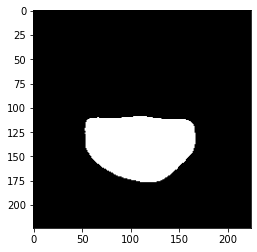

In [13]:
plt.imshow(img*255)
plt.imshow(msk*255)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

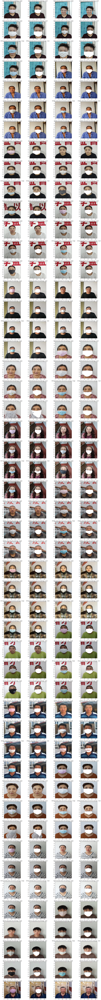

In [14]:
import matplotlib.pyplot as plt


def show_images(img_paths:list, n:int, base_dir='data'):
    fig = plt.figure(figsize=(24, 500))

    assert (len(img_paths) > n), 'number of paths should larger than n'
    
    img_paths = img_paths[:n]
    
    transform = get_train_transform(224, 224)
    
    idx = 1
    
    for path in img_paths:
        image = load_image(path)
        
        transformed = transform(image=image)
        image = transformed["image"]        
        
        title = '_'.join(path.split('/')[-2:])
        
        image = image.permute(1,2,0)
        
        
        ax = fig.add_subplot(n,4,idx)
        ax.imshow(image)
        ax.set_title(f'{title} : image')
        
        idx += 1
        
        mask_path = path.split('.')[0] + '.png'
        mask = load_image(mask_path)
        
        ax = fig.add_subplot(n,4,idx)
        ax.imshow(image+mask*255)
        
        idx += 1
        ax.set_title(f'{title} : mask')

    plt.show()
    

show_images(img_paths, 100)